# Rotational (rigid) alignment of sections

This notebook manually rotates the coordinates of the samples so that they are visually upright and aligned. No downstream analysis relies on inter-sample alignment so this is only for visualization/aesthetic purposes. This is an archival notebook.

**Inputs required:**
- `data/integrated_aging_coronal_clustered.h5ad` - AnnData object with XXX (generated from `1A_*.ipynb` notebooks for cell annotation)

**Conda environment used**: `requirements/merfish.txt`

In [1]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
import seaborn as sns
import anndata as ad
import os
from scipy.stats import pearsonr, spearmanr

In [2]:
# function for rotating about the origin

def rotate(p, origin=(0, 0), degrees=0):
    
    # rigid rotation by degrees around origin
    
    angle = np.deg2rad(degrees)
    R = np.array([[np.cos(angle), -np.sin(angle)],
                  [np.sin(angle),  np.cos(angle)]])
    o = np.atleast_2d(origin)
    p = np.atleast_2d(p)
    return np.squeeze((R @ (p.T-o.T) + o.T).T)

In [21]:
# Rotate by manually determine angles

rotation_dict = {
    "1": 190,
    "11": 137,
    "14": 295,
    "19": 225,
    "30": 215,
    "33": 298,
    "38": 141,
    "42": 292,
    "46": 187,
    "7": 294,
    "OC3": 221,
    "OC4": 167,
    "OE3": 182,
    "OE4": 148,
    "YC3": 210,
    "YC4": 154,
    "39": 175, 
    "2": 295, # BATCH 1 END
    "62": 163,
     "70": 308,
     "86": 305,
     "53": 103,
     "101": 100,
     "75": 82,
     "80": 75,
     "61": 178,
     "93": 185,
     "YC2": 290,
     "OE2": 282,
     "OC1": 125,
     "YC1": 110,
     "OC2": 96,
     "OE1": 95,
     "OT902": 90,
     "OC903": 85,
     "OT1125": 86,
     "OC1138": 83,
     "YC1989":256,
     "YC1975": 263,
     "YC1990": 82,
     "YC1982": 79,
     "OT1084": 295,
     "OC1083": 293,
     "OT1160": 284,
     "OC1226": 281,
     "68": 210,
     "81": 150,
     "57": 80,
     "97": 79,
     "89": 273,
     "67": 273,
     "34": 220,
}

# Spatial registration of sections

## Aging Coronal Dataset

In [23]:
adata = sc.read_h5ad("data/integrated_aging_coronal_clustered.h5ad")

/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided 

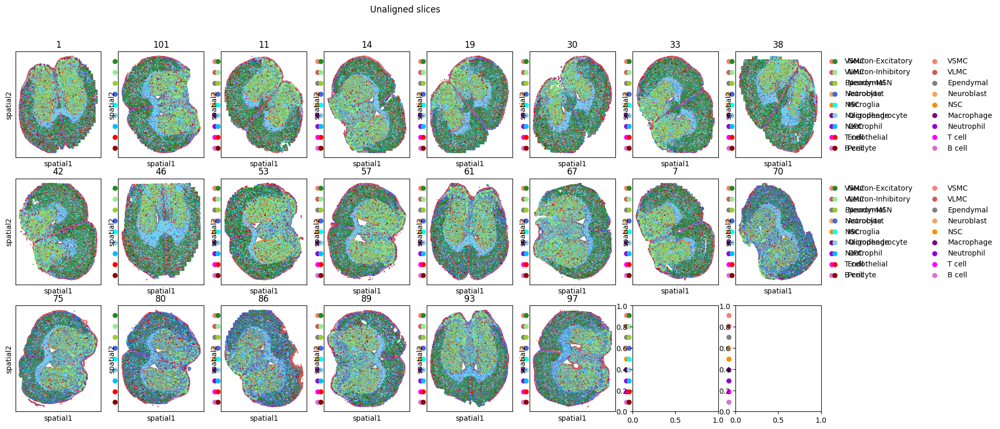

In [9]:
# Check initial visualization

fig, axarr = plt.subplots(3, 8, sharex=False, sharey=False, figsize=(20,9))
mids = np.sort(np.unique(adata.obs['mouse_id']))
for i in range(3):
    for j in range(8):
        if (i*8+j) < len(mids):
            mid= mids[i*8+j]
            sub_adata = adata[adata.obs['mouse_id']==mid].copy()
            sc.pl.embedding(sub_adata, 'spatial', color="celltype", size=10, show=False,
                            title=mid, ax=axarr[i,j], vmin=-10, vmax=10)
plt.suptitle("Unaligned slices")
plt.tight_layout()
plt.show()

In [24]:
# Center spatial coordinates

new_spatial = np.zeros(adata.obsm['spatial'].shape)

mids = np.sort(np.unique(adata.obs['mouse_id']))
for mid in mids:
    X = np.array(adata[adata.obs.mouse_id==mid].obsm["spatial"].copy())
    new_spatial[adata.obs.mouse_id==mid,:] = X-np.mean(X,axis=0)
    
adata.obsm['spatial'] = new_spatial

In [25]:
# Rotational alignment

new_spatial = np.zeros(adata.obsm['spatial'].shape)

mids = np.sort(np.unique(adata.obs['mouse_id']))
for mid in mids:
    X = np.array(adata[adata.obs.mouse_id==mid].obsm["spatial"].copy())
    new_spatial[adata.obs.mouse_id==mid,:] = rotate(X, degrees=360-rotation_dict[mid])
    
adata.obsm['spatial'] = new_spatial

/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided 

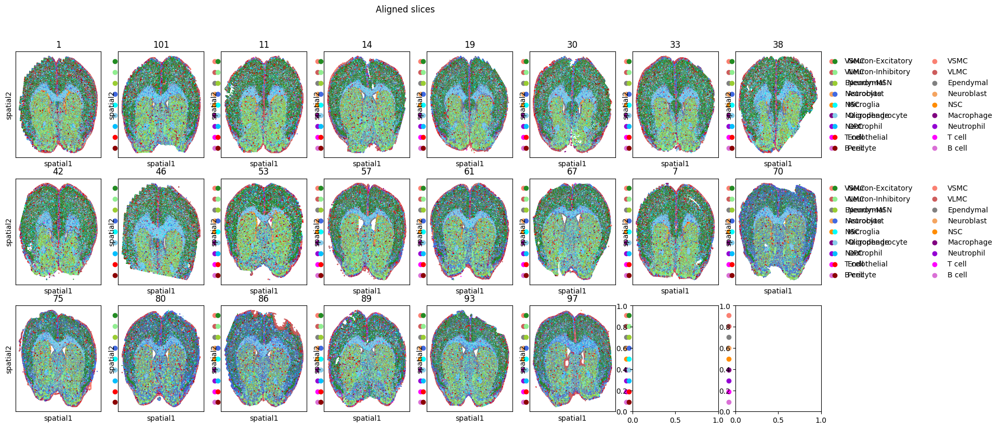

In [26]:
# Check alignment
fig, axarr = plt.subplots(3, 8, sharex=False, sharey=False, figsize=(20,9))
mids = np.sort(np.unique(adata.obs['mouse_id']))
for i in range(3):
    for j in range(8):
        if (i*8+j) < len(mids):
            mid= mids[i*8+j]
            sub_adata = adata[adata.obs['mouse_id']==mid].copy()
            sc.pl.embedding(sub_adata, 'spatial', color="celltype", size=10, show=False,
                            title=mid, ax=axarr[i,j], vmin=-10, vmax=10)
plt.suptitle("Aligned slices")
plt.tight_layout()
plt.show()

In [27]:
adata.write_h5ad("data/integrated_aging_coronal_clustered_registered.h5ad")

## Exercise Coronal Dataset

In [40]:
adata = sc.read_h5ad("data/integrated_exercise_coronal_clustered.h5ad")

/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided 

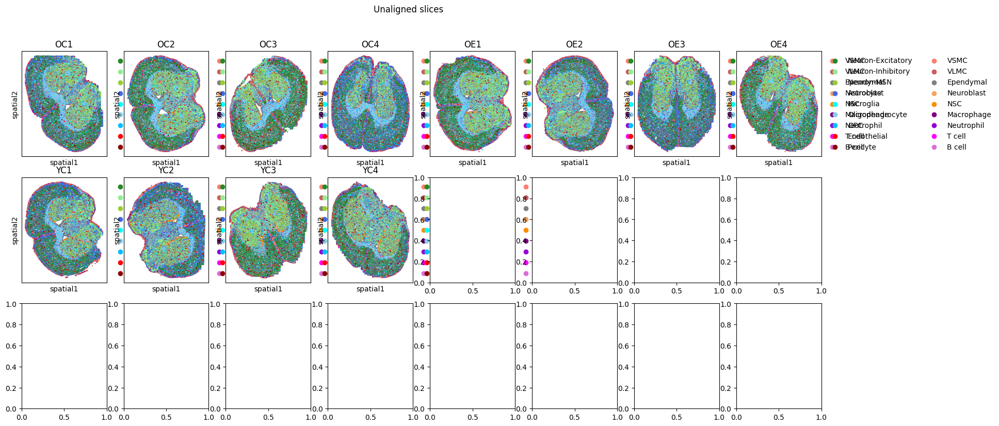

In [29]:
# Check initial visualization

fig, axarr = plt.subplots(3, 8, sharex=False, sharey=False, figsize=(20,9))
mids = np.sort(np.unique(adata.obs['mouse_id']))
for i in range(3):
    for j in range(8):
        if (i*8+j) < len(mids):
            mid= mids[i*8+j]
            sub_adata = adata[adata.obs['mouse_id']==mid].copy()
            sc.pl.embedding(sub_adata, 'spatial', color="celltype", size=10, show=False,
                            title=mid, ax=axarr[i,j], vmin=-10, vmax=10)
plt.suptitle("Unaligned slices")
plt.tight_layout()
plt.show()

In [41]:
# Center spatial coordinates

new_spatial = np.zeros(adata.obsm['spatial'].shape)

mids = np.sort(np.unique(adata.obs['mouse_id']))
for mid in mids:
    X = np.array(adata[adata.obs.mouse_id==mid].obsm["spatial"].copy())
    new_spatial[adata.obs.mouse_id==mid,:] = X-np.mean(X,axis=0)
    
adata.obsm['spatial'] = new_spatial

In [42]:
# Rotational alignment

new_spatial = np.zeros(adata.obsm['spatial'].shape)

mids = np.sort(np.unique(adata.obs['mouse_id']))
for mid in mids:
    X = np.array(adata[adata.obs.mouse_id==mid].obsm["spatial"].copy())
    new_spatial[adata.obs.mouse_id==mid,:] = rotate(X, degrees=360-rotation_dict[mid])
    
adata.obsm['spatial'] = new_spatial

/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided 

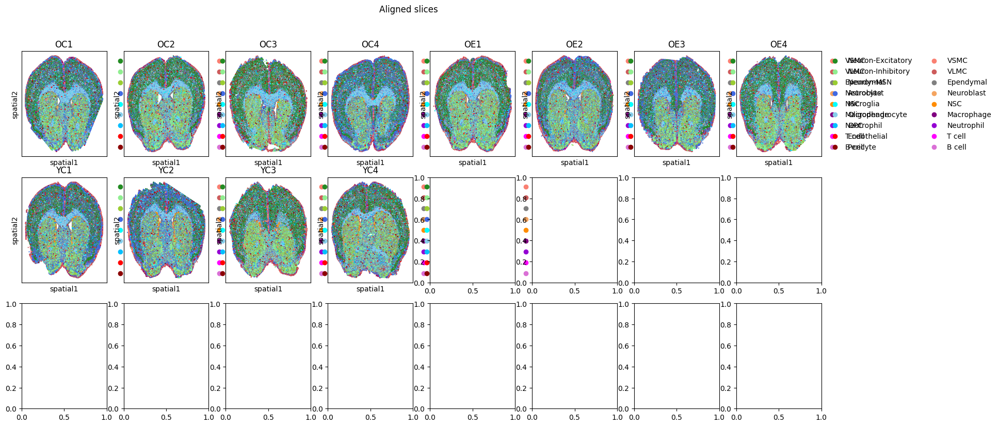

In [43]:
# Check alignment

fig, axarr = plt.subplots(3, 8, sharex=False, sharey=False, figsize=(20,9))
mids = np.sort(np.unique(adata.obs['mouse_id']))
for i in range(3):
    for j in range(8):
        if (i*8+j) < len(mids):
            mid= mids[i*8+j]
            sub_adata = adata[adata.obs['mouse_id']==mid].copy()
            sc.pl.embedding(sub_adata, 'spatial', color="celltype", size=10, show=False,
                            title=mid, ax=axarr[i,j], vmin=-10, vmax=10)
plt.suptitle("Aligned slices")
plt.tight_layout()
plt.show()

In [44]:
adata.write_h5ad("data/integrated_exercise_coronal_clustered_registered.h5ad")

## Reprogramming Coronal Dataset

In [22]:
adata = sc.read_h5ad("data/integrated_reprogramming_coronal_clustered.h5ad")

/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided 

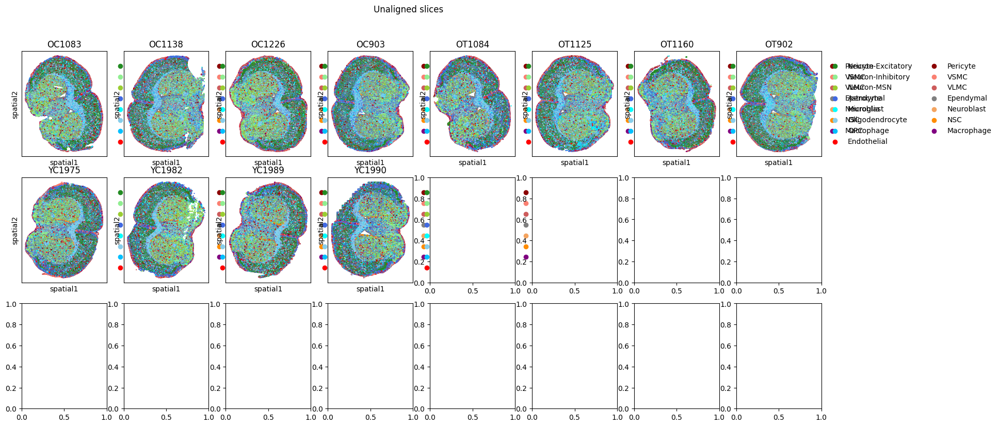

In [17]:
# Check initial visualization

fig, axarr = plt.subplots(3, 8, sharex=False, sharey=False, figsize=(20,9))
mids = np.sort(np.unique(adata.obs['mouse_id']))
for i in range(3):
    for j in range(8):
        if (i*8+j) < len(mids):
            mid= mids[i*8+j]
            sub_adata = adata[adata.obs['mouse_id']==mid].copy()
            sc.pl.embedding(sub_adata, 'spatial', color="celltype", size=10, show=False,
                            title=mid, ax=axarr[i,j], vmin=-10, vmax=10)
plt.suptitle("Unaligned slices")
plt.tight_layout()
plt.show()

In [23]:
# Center spatial coordinates

new_spatial = np.zeros(adata.obsm['spatial'].shape)

mids = np.sort(np.unique(adata.obs['mouse_id']))
for mid in mids:
    X = np.array(adata[adata.obs.mouse_id==mid].obsm["spatial"].copy())
    new_spatial[adata.obs.mouse_id==mid,:] = X-np.mean(X,axis=0)
    
adata.obsm['spatial'] = new_spatial

In [24]:
# Rotational alignment

new_spatial = np.zeros(adata.obsm['spatial'].shape)

mids = np.sort(np.unique(adata.obs['mouse_id']))
for mid in mids:
    X = np.array(adata[adata.obs.mouse_id==mid].obsm["spatial"].copy())
    new_spatial[adata.obs.mouse_id==mid,:] = rotate(X, degrees=360-rotation_dict[mid])
    
adata.obsm['spatial'] = new_spatial

/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided 

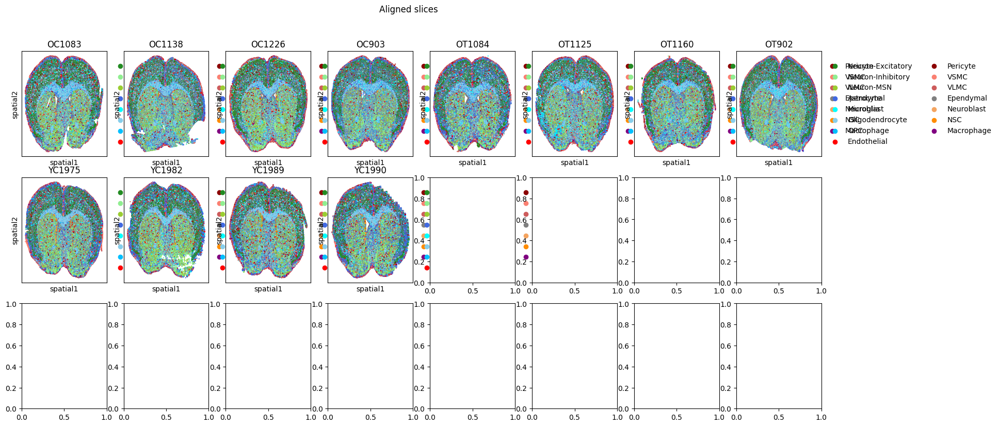

In [25]:
# Check alignment

fig, axarr = plt.subplots(3, 8, sharex=False, sharey=False, figsize=(20,9))
mids = np.sort(np.unique(adata.obs['mouse_id']))
for i in range(3):
    for j in range(8):
        if (i*8+j) < len(mids):
            mid= mids[i*8+j]
            sub_adata = adata[adata.obs['mouse_id']==mid].copy()
            sc.pl.embedding(sub_adata, 'spatial', color="celltype", size=10, show=False,
                            title=mid, ax=axarr[i,j], vmin=-10, vmax=10)
plt.suptitle("Aligned slices")
plt.tight_layout()
plt.show()

In [26]:
adata.write_h5ad("data/integrated_reprogramming_coronal_clustered_registered.h5ad")

## Aging Sagittal Dataset

In [34]:
adata = sc.read_h5ad("data/integrated_aging_sagittal_clustered.h5ad")

/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided 

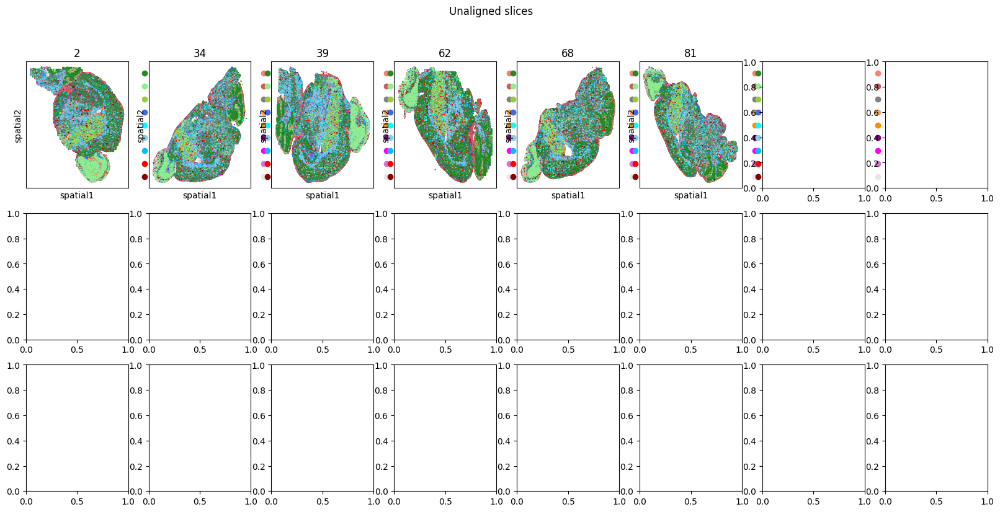

In [46]:
# Check initial visualization

fig, axarr = plt.subplots(3, 8, sharex=False, sharey=False, figsize=(20,9))
mids = np.sort(np.unique(adata.obs['mouse_id']))
for i in range(3):
    for j in range(8):
        if (i*8+j) < len(mids):
            mid= mids[i*8+j]
            sub_adata = adata[adata.obs['mouse_id']==mid].copy()
            sc.pl.embedding(sub_adata, 'spatial', color="celltype", size=10, show=False,
                            title=mid, ax=axarr[i,j], vmin=-10, vmax=10)
plt.suptitle("Unaligned slices")
plt.tight_layout()
plt.show()

In [35]:
# Center spatial coordinates

new_spatial = np.zeros(adata.obsm['spatial'].shape)

mids = np.sort(np.unique(adata.obs['mouse_id']))
for mid in mids:
    X = np.array(adata[adata.obs.mouse_id==mid].obsm["spatial"].copy())
    new_spatial[adata.obs.mouse_id==mid,:] = X-np.mean(X,axis=0)
    
adata.obsm['spatial'] = new_spatial

In [36]:
# Rotational alignment

new_spatial = np.zeros(adata.obsm['spatial'].shape)

mids = np.sort(np.unique(adata.obs['mouse_id']))
for mid in mids:
    X = np.array(adata[adata.obs.mouse_id==mid].obsm["spatial"].copy())
    new_spatial[adata.obs.mouse_id==mid,:] = rotate(X, degrees=360-rotation_dict[mid])
    
adata.obsm['spatial'] = new_spatial

In [37]:
# flip alignment

flip_dict = {
    "2": -1,
    "34": -1,
    "39": 1,
    "62": -1,
    "68": -1,
    "81": -1,
}


new_spatial = np.zeros(adata.obsm['spatial'].shape)

mids = np.sort(np.unique(adata.obs['mouse_id']))
for mid in mids:
    X = np.array(adata[adata.obs.mouse_id==mid].obsm["spatial"].copy())
    new_spatial[adata.obs.mouse_id==mid,0] = flip_dict[mid]*X[:,0]
    new_spatial[adata.obs.mouse_id==mid,1] = X[:,1]
    
adata.obsm['spatial'] = new_spatial

/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/edsun/.conda/envs/merfish/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided 

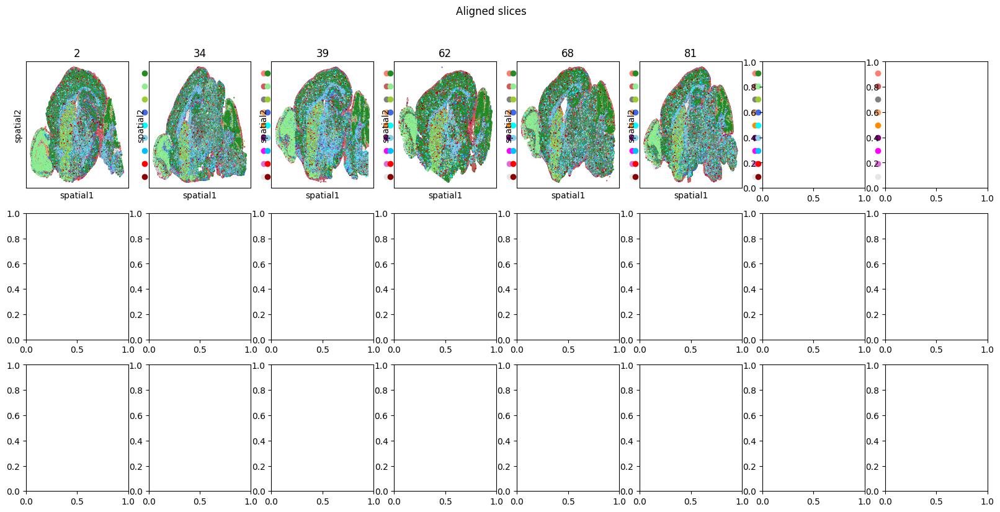

In [38]:
# Check alignment

fig, axarr = plt.subplots(3, 8, sharex=False, sharey=False, figsize=(20,9))
mids = np.sort(np.unique(adata.obs['mouse_id']))
for i in range(3):
    for j in range(8):
        if (i*8+j) < len(mids):
            mid= mids[i*8+j]
            sub_adata = adata[adata.obs['mouse_id']==mid].copy()
            sc.pl.embedding(sub_adata, 'spatial', color="celltype", size=10, show=False,
                            title=mid, ax=axarr[i,j], vmin=-10, vmax=10)
plt.suptitle("Aligned slices")
plt.tight_layout()
plt.show()

In [39]:
adata.write_h5ad("data/integrated_aging_sagittal_clustered_registered.h5ad")

In [4]:
# transfer annotations to raw data

adata = sc.read_h5ad("data/integrated_aging_sagittal_clustered_registered.h5ad")
raw_adata = sc.read_h5ad("data/integrated_aging_sagittal_clustered_raw.h5ad")

# add labels
raw_adata.obsm['spatial'] = np.array(adata.obsm['spatial'].copy())

# save updated raw dataset
raw_adata.write_h5ad("data/integrated_aging_sagittal_clustered_registered_raw.h5ad")